In [20]:
import time
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize

import anndata
import scanpy as sc
from ALLCools.clustering import tsne
from ALLCools.plot import *
from wmb import aibs, mm10

mpl.style.use('default')
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = 'Helvetica'


In [2]:
def dump_embedding(adata, name, n_dim=2):
    # put manifold coordinates into adata.obs
    for i in range(n_dim):
        adata.obs[f"{name}_{i}"] = adata.obsm[f"X_{name}"][:, i]
    return adata

In [3]:
# Parameters
group_name = 'STR'

In [4]:
t = group_name

# integrate all datasets

In [5]:
npc = 50

In [6]:
obs_list, pca_list = [], []
for xx, yy in zip(
    ["rs1_mch", "rs2_mch", "rna"], ["CEMBA_snmC", "CEMBA_EpiRetro", "AIBS_10x"]
):
    tmp = anndata.read_h5ad(glob.glob(f"{t}_*_{xx}.h5ad")[0])
    tmp.obs["Study"] = yy
    obs_list.append(tmp.obs)
    if xx=='rs1_mch':
        pca_list.append(normalize(tmp.obsm['cef_pca'][:, :npc], axis=1))
    else:
        pca_list.append(normalize(tmp.obsm['X_pca_corrected'][:, :npc], axis=1))


In [7]:
ncell = np.sum([xx.shape[0] for xx in obs_list])
adata_merge = anndata.AnnData(
    X=np.ones((ncell, 1)), obs=pd.concat(obs_list, axis=0)
)
adata_merge

AnnData object with n_obs × n_vars = 53756 × 1
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'L1', 'L1_annot', 'L4', 'L4Region', 'L2_annot', 'Train', 'Study', 'Exp', 'Source', 'Target', 'Gender', 'L2', 'L3', 'PlateNormReads', 'count', 'umi_count'

In [8]:
adata_merge.obsm["X_pca"] = np.concatenate(pca_list, axis=0)[:, :npc]


In [11]:
start_time = time.time()
tsne(
    adata_merge,
    obsm="X_pca",
    metric="euclidean",
    exaggeration=-1,
    perplexity=50,
    n_jobs=-1,
)
dump_embedding(adata_merge, "tsne")
adata_merge.obsm[f"u{npc}seurat_tsne"] = adata_merge.obsm["X_tsne"].copy()
print(time.time() - start_time)

262.8973059654236


In [12]:
start_time = time.time()
sc.pp.neighbors(
    adata_merge, use_rep="X_pca", n_neighbors=25, random_state=0, metric="cosine"
)
# sc.tl.umap(adata_merge, random_state=0, maxiter=200)
# adata_merge.obsm['cef_u50seuratds20kcc30all2mc_umap'] = adata_merge.obsm['X_umap'].copy()
print("finish finding neighbors")
print(time.time() - start_time)
res = 1.0
sc.tl.leiden(adata_merge, resolution=res, random_state=0)

print(time.time() - start_time)

finish finding neighbors
28.01606273651123
45.66109108924866


In [13]:
adata_merge.obs.loc[:,adata_merge.obs.dtypes == 'object'] = adata_merge.obs.loc[:,adata_merge.obs.dtypes == 'object'].astype(str)
adata_merge.write_h5ad(f'{t}_{adata_merge.shape[0]}_rs1rs2rna.h5ad')


In [14]:
ds = 0.2
coord_base = "tsne"

In [15]:
tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "AIBS_10x"]
count = tmp["L2_annot"].value_counts()
count = count[count > (tmp.shape[0] * 0.0005)]
tmp = tmp[tmp["L2_annot"].isin(count.index)]
leg = np.sort(count.index)


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


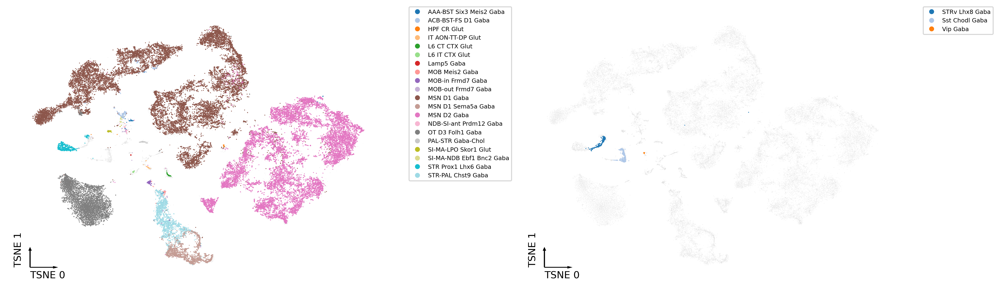

In [16]:
nplot = (count.shape[0] - 1) // 20 + 1
nrow = (nplot - 1) // 2 + 1
ncol = 2

fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 7, nrow * 4), dpi=300, constrained_layout=True)
for i in range(nplot):
    legtmp = leg[(i * 20) : ((i + 1) * 20)]
    tmp0 = tmp.loc[tmp["L2_annot"].isin(legtmp)]
    ax = axes.flatten()[i]
    ax.scatter(
        adata_merge.obs[f"{coord_base}_0"],
        adata_merge.obs[f"{coord_base}_1"],
        c="#e0e0e0",
        edgecolors="none",
        s=ds,
        alpha=0.5,
        rasterized=True,
    )
    _ = categorical_scatter(
        data=tmp0,
        ax=ax,
        coord_base=coord_base,
        s=ds * 4,
        hue="L2_annot",
        # text_anno='L2_annot',
        palette="tab20",
        labelsize=10,
        max_points=None,
        scatter_kws={"rasterized": True},
        show_legend=True,
        legend_kws={"ncol": 1, "fontsize": 6},
    )
if nrow * ncol > nplot:
    for i in range(nplot, nrow * ncol):
        axes.flatten()[i].axis("off")

plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.AIBSL2.pdf', transparent=True)


In [18]:
tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "CEMBA_snmC"]
count = tmp["L2_annot"].value_counts()
count = count[count > (tmp.shape[0] * 0.0005)]
tmp = tmp[tmp["L2_annot"].isin(count.index)]
leg = np.unique(np.concatenate([leg, np.sort(count.index)]))


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


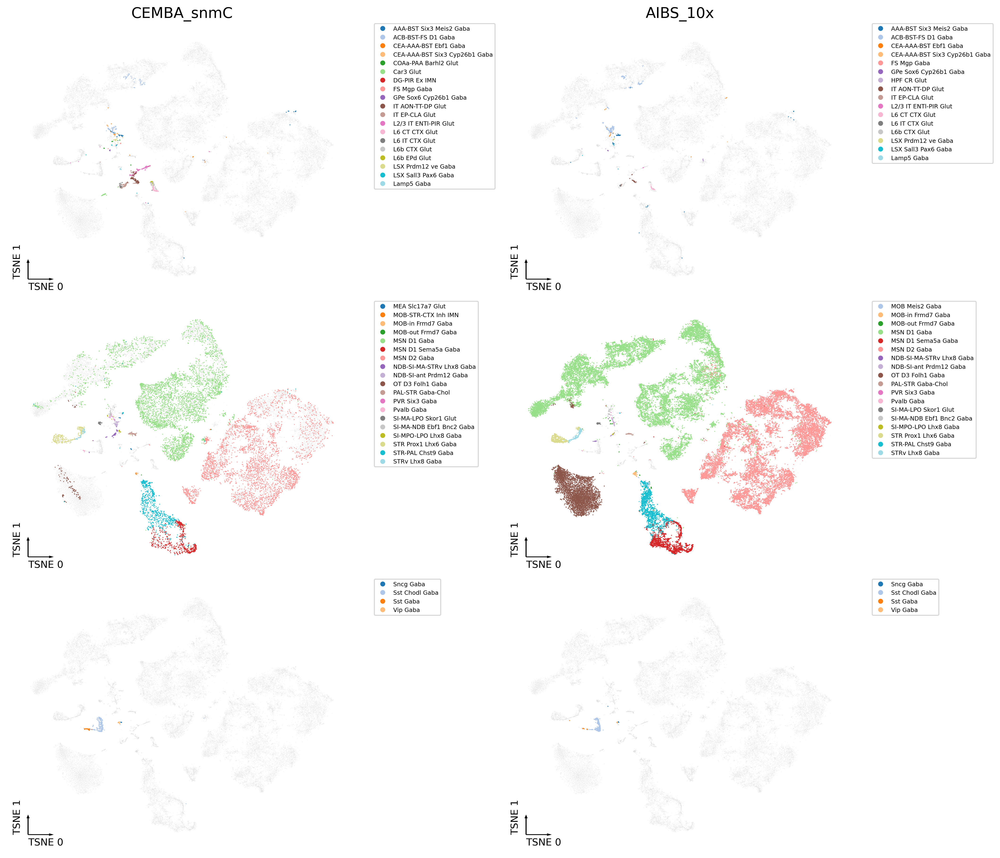

In [21]:
nrow = (len(leg) - 1) // 20 + 1
ncol = 2
palette = {xx:yy for xx,yy in zip(leg, sns.color_palette('tab20', len(leg)))}
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 7, nrow * 4), dpi=300, constrained_layout=True)
for k in range(2):
    axes[0,k].set_title(["CEMBA_snmC", 'AIBS_10x'][k], fontsize=15)
    tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == ["CEMBA_snmC", 'AIBS_10x'][k]]
    for i in range(nrow):
        legtmp = leg[(i * 20) : ((i + 1) * 20)]
        tmp0 = tmp.loc[tmp["L2_annot"].isin(legtmp)]
        ax = axes[i,k]
        ax.scatter(
            adata_merge.obs[f"{coord_base}_0"],
            adata_merge.obs[f"{coord_base}_1"],
            c="#e0e0e0",
            edgecolors="none",
            s=ds,
            alpha=0.5,
            rasterized=True,
        )
        _ = categorical_scatter(
            data=tmp0,
            ax=ax,
            coord_base=coord_base,
            s=ds * 4,
            hue="L2_annot",
            # text_anno='L2_annot',
            palette=palette,
            labelsize=10,
            max_points=None,
            scatter_kws={"rasterized": True},
            show_legend=True,
            legend_kws={"ncol": 1, "fontsize": 6},
        )

plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.CEMBAL2.pdf', transparent=True)


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


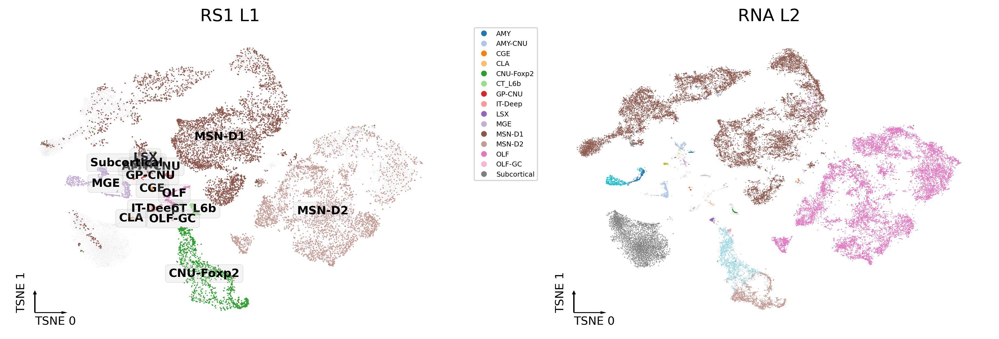

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=300, constrained_layout=True)
ax = axes.flatten()

tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "CEMBA_snmC"]
count = tmp["L1_annot"].value_counts()
count = count[count > (tmp.shape[0] * 0.001)]
tmp = tmp[tmp["L1_annot"].isin(count.index)]
ax[0].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    alpha=0.5,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[0],
    coord_base=coord_base,
    s=ds * 5,
    hue="L1_annot",
    text_anno="L1_annot",
    palette="tab20",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=True,
    outline=None,
    legend_kws = {'ncol':1, 'fontsize':6}
)

tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "AIBS_10x"]
count = tmp["L2_annot"].value_counts()
count = count[count > (tmp.shape[0] * 0.0005)]
tmp = tmp[tmp["L2_annot"].isin(count.index)]
ax[1].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    alpha=0.5,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[1],
    coord_base=coord_base,
    s=ds * 2,
    hue="L2_annot",
    # text_anno='L2_annot',
    palette="tab20",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    # show_legend=True,
    # legend_kws = {'ncol':2, 'fontsize':4}
)
for i, xx in enumerate(["RS1 L1", "RNA L2"]):
    axes.flatten()[i].set_title(xx, fontsize=15)

plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.CEMBAL1_AIBSL2.pdf', transparent=True)


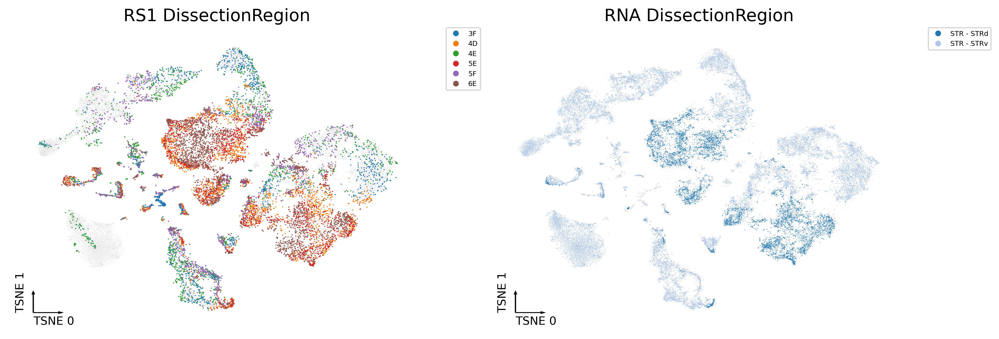

In [23]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=300, constrained_layout=True)
ax = axes.flatten()

tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "CEMBA_snmC"]
ax[0].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[0],
    coord_base=coord_base,
    s=ds * 5,
    hue="CEMBARegion",
    # text_anno='Study',
    palette="tab10",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=True,
    legend_kws={"ncol": len(np.unique(tmp['CEMBARegion']))//30+1, "fontsize": 6},
)


tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "AIBS_10x"]
ax[1].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[1],
    coord_base=coord_base,
    s=ds,
    hue="DissectionRegion",
    # text_anno='Study',
    palette="tab20",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=True,
    legend_kws={"ncol": len(np.unique(tmp['DissectionRegion']))//30+1, "fontsize": 6},
)

for i, xx in enumerate(["RS1 DissectionRegion", "RNA DissectionRegion"]):
    axes.flatten()[i].set_title(xx, fontsize=15)

plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.CEMBARegion_AIBSRegion.pdf', transparent=True)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


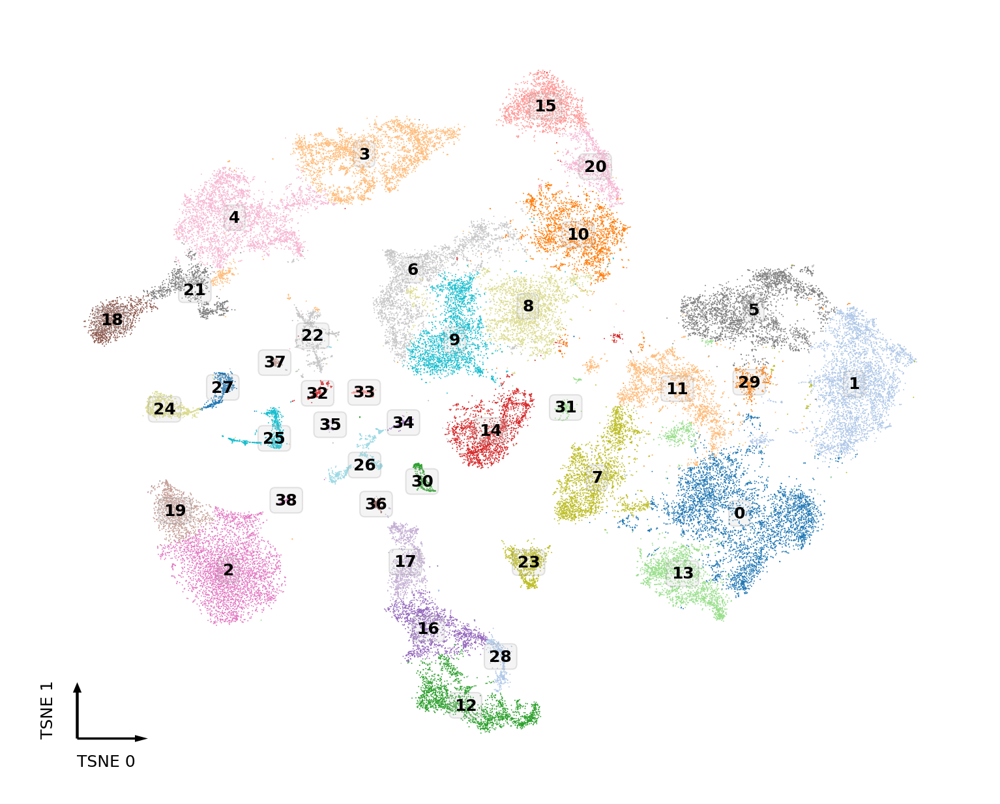

In [24]:
fig, ax = plt.subplots(figsize=(5, 4), dpi=300, constrained_layout=True)
_ = categorical_scatter(
    data=adata_merge.obs,
    ax=ax,
    coord_base=coord_base,
    s=ds,
    hue="leiden",
    text_anno="leiden",
    palette="tab20",
    labelsize=6,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=False,
    outline=None,
    # legend_kws = {'ncol':1, 'fontsize':4}
)

plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.cocluster.pdf', transparent=True)


In [25]:
tarall = [
    "PFC",
    "MOp",
    "SSp",
    "ACA",
    "AI",
    "AUDp",
    "RSP",
    "PTLp",
    "VISp",
    "MOB",
    "ENT",
    "HPF",
    "PIR",
    "AMY",
    "STR",
    "PAL",
    "TH",
    "HY",
    "SC",
    "VTA",
    "P",
    "MY",
    "CBN",
    "CBX",
]
target_list = [xx for xx in tarall if xx in adata_merge.obs["Target"].values]
target_list

['HY', 'VTA']

In [26]:
rs2_subregion_dict = {
    "MOp": ["3C", "4B"],
    "SSp": ["6B", "7B"],
    "ACA": ["3A", "4A", "5A"],
    "AI": ["3D"],
    "RSP": ["9A", "10A"],
    "AUD": ["9D", "10C"],
    "PTLp": ["9B"],
    "VIS": ["11B", "12B"],
    "ENT": ["10D11D12D13B"],
    "CAa": ["8E9H"],
    "CAp": ["10E11E"],
    "DGa": ["8J9J"],
    "DGp": ["10F11F"],
    "PIRa": ["2D3E4F5G"],
    "PIRp": ["6D7D8D9E"],
    "MOB": ["1C"],
    "AON": ["2E"],
    "PAL": ["4H5H6F7F", "6F7F"],
    "STR": ["4D5E6E"],
    "AMY": ["7H8H9G"],
    "THl": ["7E8F"],
    "THm": ["7G8G"],
    "THp": ["9K10G"],
    "HY": ["6H7J8K9L"],
    "SC": ["11G12F13C"],
    "MRN": ["10H11H12H"],
    "VTA": ["10J11J"],
    "PAG": ["12G13D"],
    "IC": ["14A"],
    "P": ["12J13E13F14C14D"],
    "MY": ["15C16C17B18B"],
    "CBX": ["14B15B18A"],
}

slice2source = {}
for xx in rs2_subregion_dict:
    for x in rs2_subregion_dict[xx]:
        slice2source[x] = xx

In [27]:
cellfilter = adata_merge.obs["Target"].astype(str) != "nan"
adata_merge.obs["Source"] = adata_merge.obs["Source"].astype(str)
adata_merge.obs.loc[cellfilter, "Source"] = adata_merge.obs.loc[
    cellfilter, "Slice"
].map(slice2source)
adata_merge.obs.loc[cellfilter, "Source"].value_counts()

STR    198
Name: Source, dtype: int64

In [28]:
grouplist = [
    f"{xx}-{yy}"
    for xx in adata_merge.obs.loc[cellfilter, "Source"].unique()
    for yy in ["male", "female"]
]
target_palette = {
    xx: yy
    for xx, yy in zip(grouplist, list(sns.color_palette("tab20", len(grouplist))))
}
grouplist

['STR-male', 'STR-female']

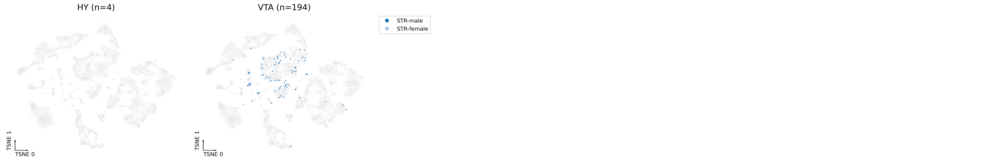

In [29]:
ncol = 5
nrow = (len(target_list) - 1) // ncol + 1
coord_base = "tsne"
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 5, nrow * 4), dpi=300, constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    tmp = adata_merge.obs.loc[adata_merge.obs["Target"] == xx].copy()
    ax.scatter(
        adata_merge.obs[f"{coord_base}_0"],
        adata_merge.obs[f"{coord_base}_1"],
        c="#e0e0e0",
        edgecolors="none",
        s=ds,
        rasterized=True,
    )
    _ = categorical_scatter(
        data=tmp,
        ax=ax,
        coord_base=coord_base,
        s=ds * 20,
        hue=tmp[["Source", "Gender"]].apply("-".join, axis=1),
        # text_anno='leiden',
        palette=target_palette,
        labelsize=10,
        max_points=None,
        scatter_kws={"rasterized": True},
        show_legend=False,
    )
    ax.set_title(f"{xx} (n={tmp.shape[0]})", fontsize=15)

markers = [
    plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
    for color in target_palette.values()
]

if len(target_list)<=ncol:
    ax = axes[len(target_list)-1]
else:
    ax = axes[0, -1]
ax.legend(
    markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
)

for ax in axes.flatten()[len(target_list) :]:
    ax.axis("off")

plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.CEMBATarget.pdf', transparent=True)

In [30]:
gene_meta = mm10.get_gene_metadata(annot_version = 'GENCODE_vm23')
gene_meta

,chrom,source,feature,start,end,score,strand,phase,transcript_id,gene_type,...,transcript_type,transcript_status,transcript_name,exon_number,exon_id,level,gene_version,mgi_id,havana_gene,tag
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSMUSG00000051951,chr1,HAVANA,gene,3205901,3671498,.,-,.,NaN,protein_coding,...,NaN,NaN,NaN,NaN,NaN,2,5,MGI:3528744,OTTMUSG00000026353.2,NaN
ENSMUSG00000089699,chr1,HAVANA,gene,3466587,3513553,.,+,.,NaN,lncRNA,...,NaN,NaN,NaN,NaN,NaN,2,1,MGI:3780162,OTTMUSG00000026352.1,NaN
ENSMUSG00000102331,chr1,HAVANA,gene,3647309,3658904,.,-,.,NaN,lncRNA,...,NaN,NaN,NaN,NaN,NaN,2,1,MGI:5012123,OTTMUSG00000049924.1,NaN
ENSMUSG00000102343,chr1,HAVANA,gene,3905739,3986215,.,-,.,NaN,lncRNA,...,NaN,NaN,NaN,NaN,NaN,2,1,MGI:5610609,OTTMUSG00000049934.1,NaN
ENSMUSG00000025900,chr1,HAVANA,gene,3999557,4409241,.,-,.,NaN,protein_coding,...,NaN,NaN,NaN,NaN,NaN,2,12,MGI:1341105,OTTMUSG00000049985.3,overlapping_locus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000095523,JH584299.1,ENSEMBL,gene,837364,840451,.,+,.,NaN,protein_coding,...,NaN,NaN,NaN,NaN,NaN,3,1,NaN,NaN,NaN
ENSMUSG00000095475,JH584299.1,ENSEMBL,gene,910289,913083,.,-,.,NaN,protein_coding,...,NaN,NaN,NaN,NaN,NaN,3,1,NaN,NaN,NaN
ENSMUSG00000094855,JH584299.1,ENSEMBL,gene,921942,924675,.,+,.,NaN,protein_coding,...,NaN,NaN,NaN,NaN,NaN,3,1,NaN,NaN,NaN


In [31]:
ens2gene = gene_meta["gene_name"].to_dict()
gene2ens = gene_meta.reset_index().set_index("gene_name")["gene_id"].to_dict()

In [32]:
selc = adata_merge.obs.index[adata_merge.obs["Study"] == "AIBS_10x"]
marker = [
    "Slc17a6",
    "Slc17a7",
    "Slc32a1",
    "Gad1",
    "Gad2",
    "Th",
    "Slc6a5",
    "Chat",
    "Fev",
]

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


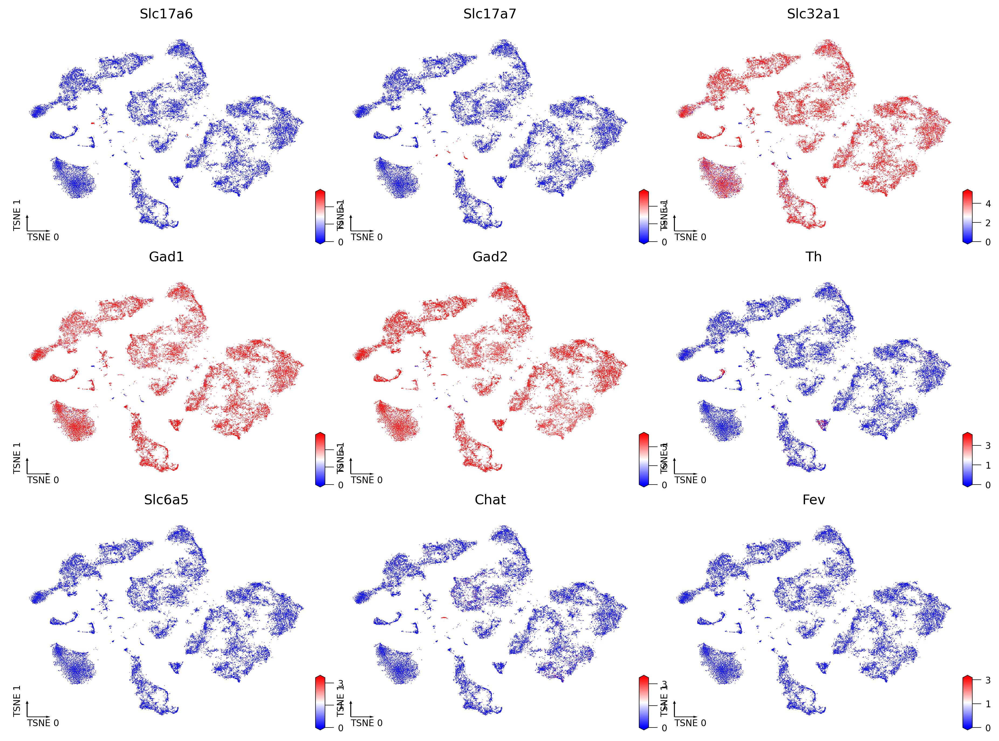

In [33]:
ds = 0.2
cord_base = "tsne"
fig, axes = plt.subplots(3, 3, figsize=(12, 9), dpi=300, constrained_layout=True)
for xx, ax in zip(marker, axes.flatten()):
    tmp = aibs.get_tenx_gene_data(gene2ens[xx])
    tmp = tmp.loc[tmp.index.isin(adata_merge.obs.index)]
    _ = continuous_scatter(
        data=adata_merge.obs,
        ax=ax,
        coord_base=cord_base,
        s=ds,
        cmap="bwr",
        labelsize=8,
        max_points=50000,
        scatter_kws={"rasterized": True},
        hue=tmp,
        hue_norm=[0, np.percentile(tmp[tmp > 0], 50)],
    )
    ax.set_title(xx, fontsize=12)
    
plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.marker_expr.pdf', transparent=True)
